# Aplastic anemia, NK cells

EG34, EG35 and EG36 are aplastic anemia cases. EG34 and EG36 samples are from the same donor. 

In this notebook aplastic anemia samples are merged together and UMAPs are generated based on RNA, proteins or latent space. Only NK cells are selected based on clustering + marker gene/protein analysis done in "easi_nk_AA_clustering" -notebook. Leiden clusters are calculated from UMAP based on latent space coordinates and highly expressed genes/markers are searched using scanpy rank_genes_groups -function. 

Finally, markers received from HRUH Aplastic anemia presentation (unpublished data) and Melsen et al. paper are visualized. 

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



In [75]:
#Easigenomics dataset, all AA samples merged

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/AA_norm.h5ad')

In [76]:
adata

AnnData object with n_obs × n_vars = 5469 × 11572
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.05'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'd

In [77]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata, use_rep="X_totalVI")    

sc.tl.umap(adata)


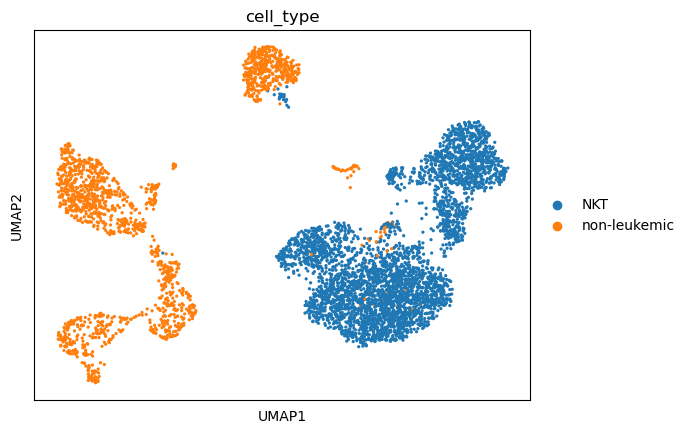

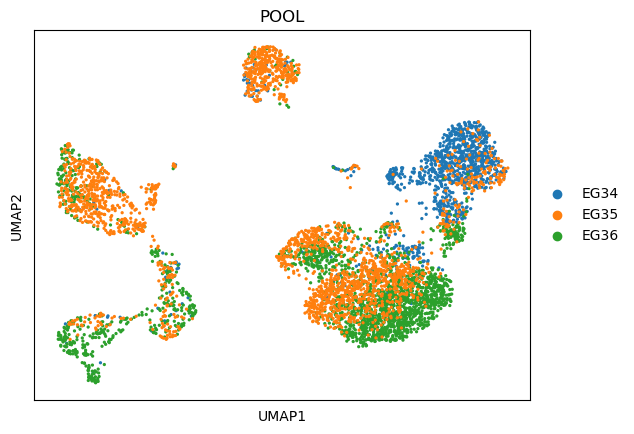

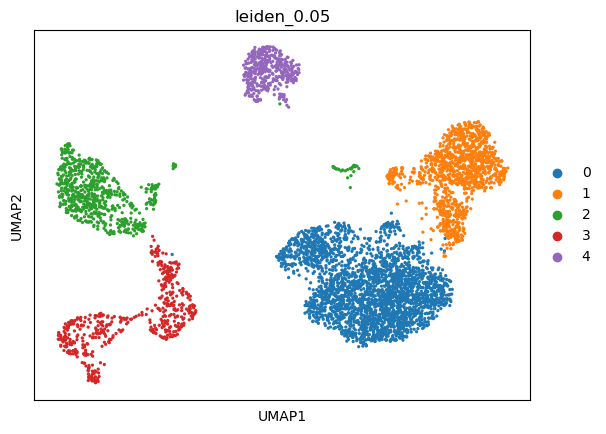

In [78]:
#latent space

sc.pl.umap(adata, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(adata, color = ['POOL'], color_map = 'viridis')

sc.pl.umap(adata, color = ['leiden_0.05'], color_map = 'viridis')


In [79]:
#selecting only NK cells (=cluster 0), identified in earlier notebook

adata_nk = adata[adata.obs['leiden_0.05'] == "0"]

In [80]:
#Within the NK cell cluster there are cells annotated as "non-leukemic", these cells are removed from analysis 

adata_nk = adata_nk[adata_nk.obs['cell_type'] == "NKT"]

In [81]:
adata_nk

View of AnnData object with n_obs × n_vars = 2655 × 11572
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.05'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersion

In [55]:
#adding protein information to obs

a = adata_nk.obs
b = prot

adata1=pd.concat([a, b], axis=1)
adata_nk.obs=adata1

In [82]:
adata_nk

View of AnnData object with n_obs × n_vars = 2655 × 11572
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.05'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersion

In [83]:
#Calculating neighbors for UMAPs, only NK cells

sc.pp.neighbors(adata_nk, use_rep="X_totalVI")    

sc.tl.umap(adata_nk)

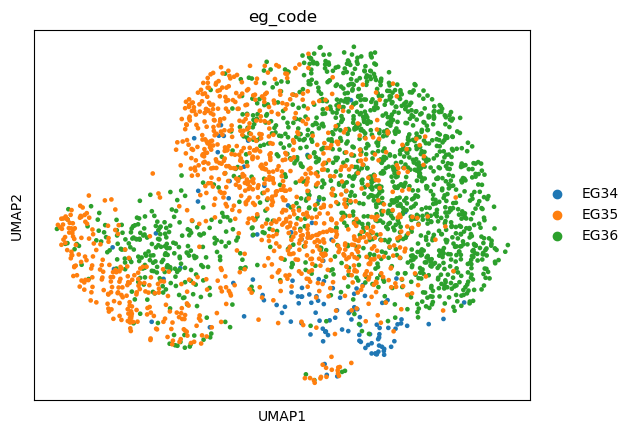

In [84]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')

## Clustering by protein expression

In [85]:
adata_nk_prot = adata_nk.copy()

In [86]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_nk_prot, use_rep="protein_expression_dsb")    

sc.tl.umap(adata_nk_prot)

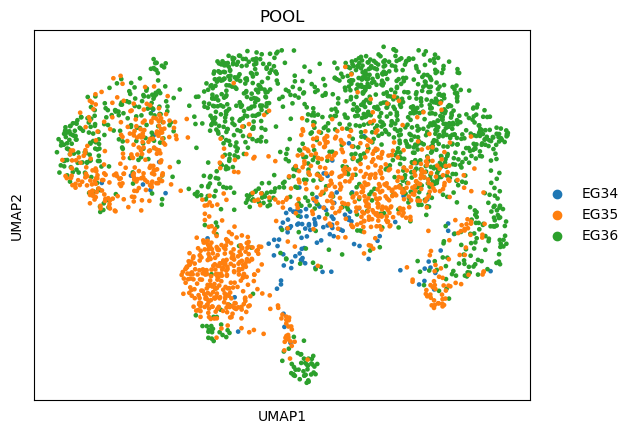

In [87]:
sc.pl.umap(adata_nk_prot, color = ['POOL'], color_map = 'viridis')

## Clustering by RNA

In [88]:
adata_nk_rna = adata_nk.copy()

In [89]:
sc.pp.pca(adata_nk_rna)

In [90]:
#calculating neighbors

sc.pp.neighbors(adata_nk_rna)

sc.tl.umap(adata_nk_rna)

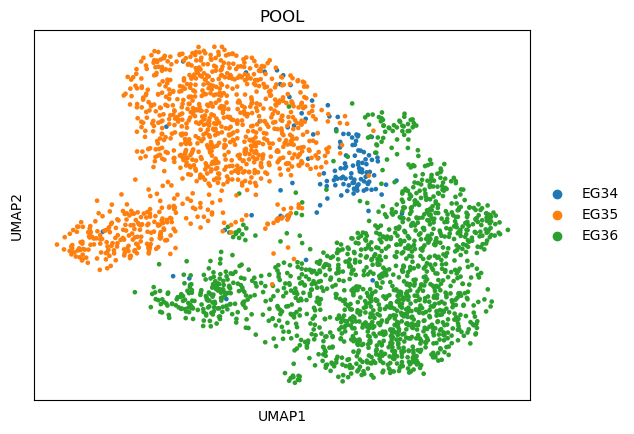

In [91]:
sc.pl.umap(adata_nk_rna, color = ['POOL'], color_map = 'viridis')

- When clustered based on RNA, cells are mostly clustering by sample (EG34 and EG36 from same donor. In UMAPs generated based on latent space or protein samples are better mixed. 

In [92]:
#Calculating leidens for latent object
sc.tl.leiden(adata_nk, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata_nk, resolution = 0.7, key_added = "leiden_0.7")
sc.tl.leiden(adata_nk, resolution = 0.8, key_added = "leiden_0.8")


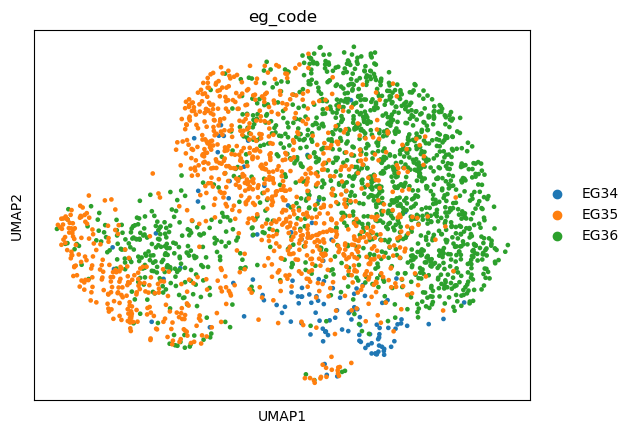

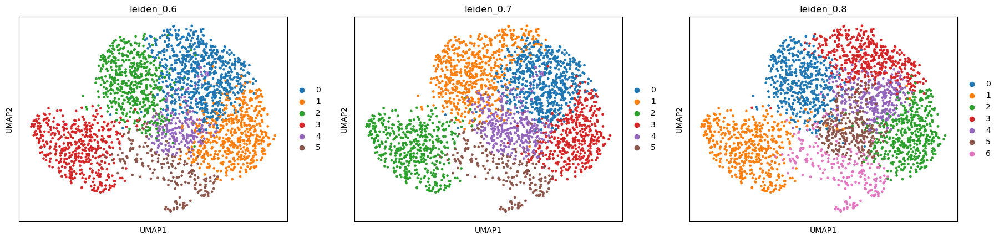

In [93]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')
sc.pl.umap(adata_nk, color=['leiden_0.6', 'leiden_0.7', 'leiden_0.8'], ncols =3)

- Despite previous observations about cells clustering based on samples, leiden clustering results are promising. Identified clusters are not showing assignment on the basis of sample origin, but clusters mostly contain cells from different samples.

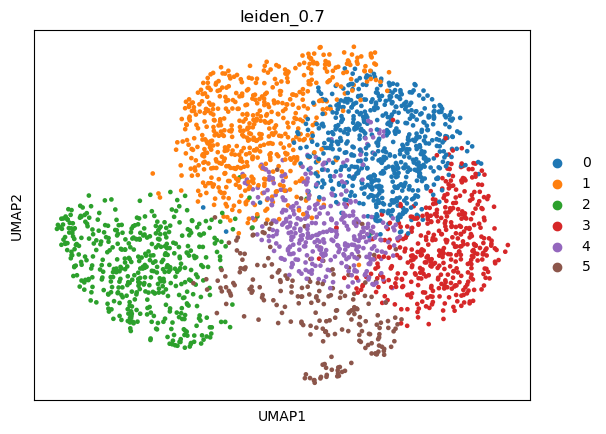

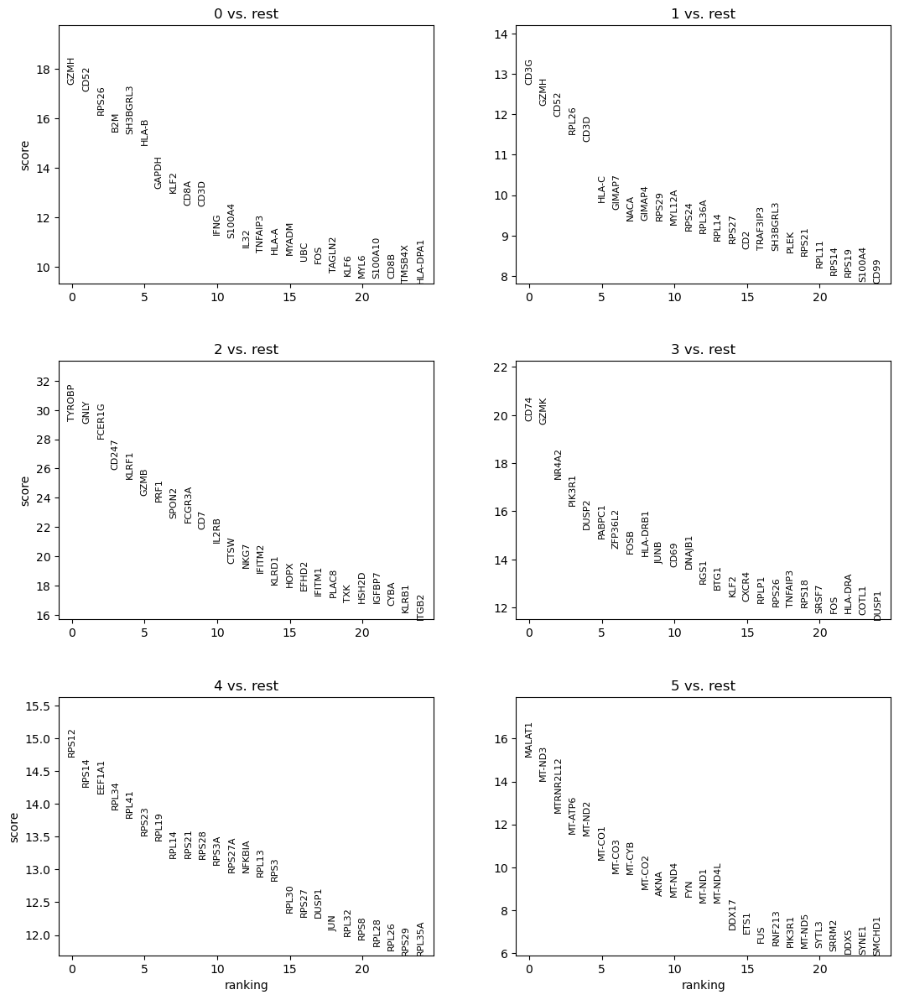

In [94]:
sc.pl.umap(adata_nk, color=['leiden_0.7'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.7', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [95]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = adata_nk.var_names.str.startswith('MT-')
ribo_genes = adata_nk.var_names.str.startswith('RPL')
ribo_genes1 = adata_nk.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_nk = adata_nk[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

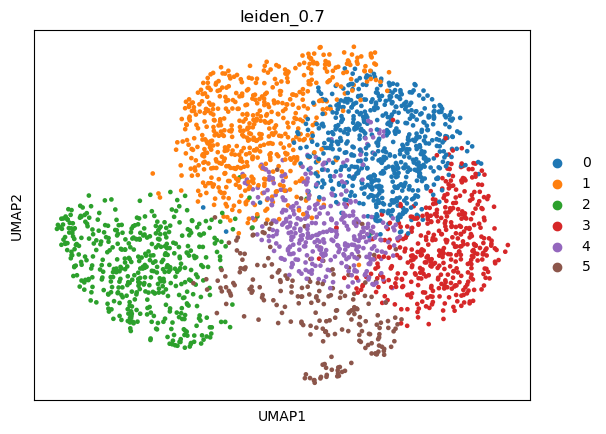

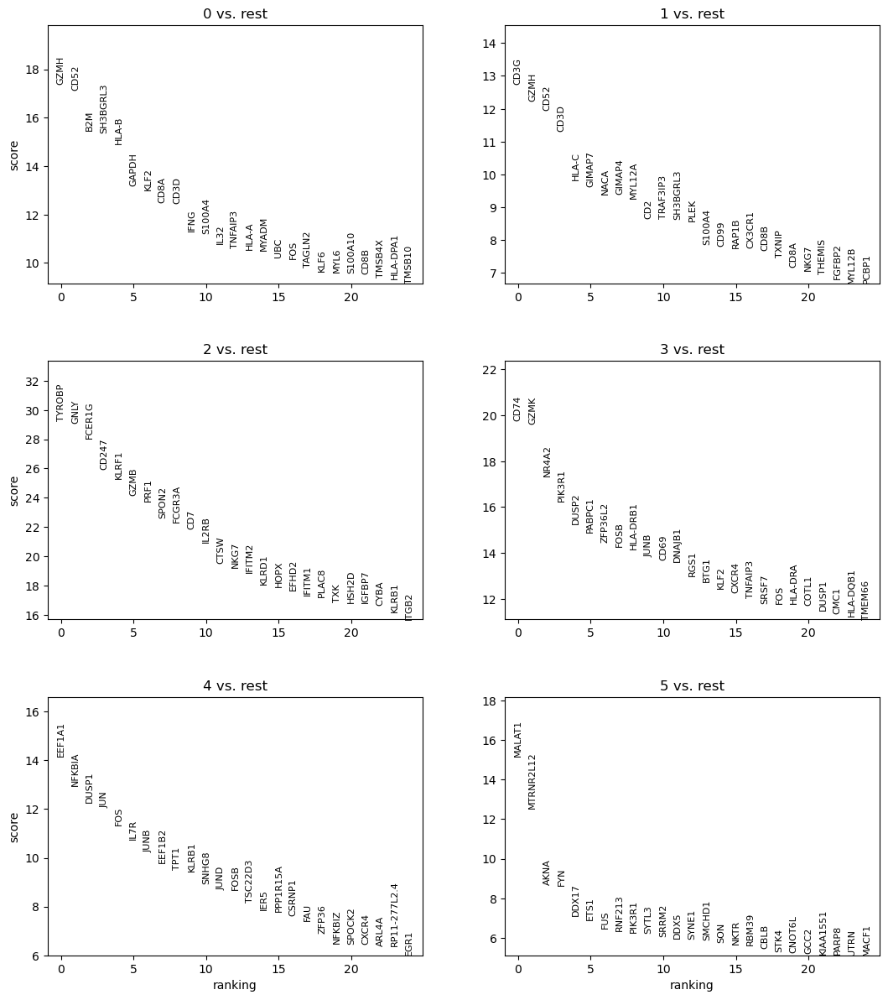

In [96]:
sc.pl.umap(adata_nk, color=['leiden_0.7'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.7', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

- Clusters 0 and 1 : adaptive like? 
- Cluster 2 : mature CD56dim?
- Cluster 3 : CD56bright NK cells (GZMK => Yang, Melsen)
- Cluster 4 : active (Yang => NFKBIA, DUSP1, JUN, JUNB, CXCR4)




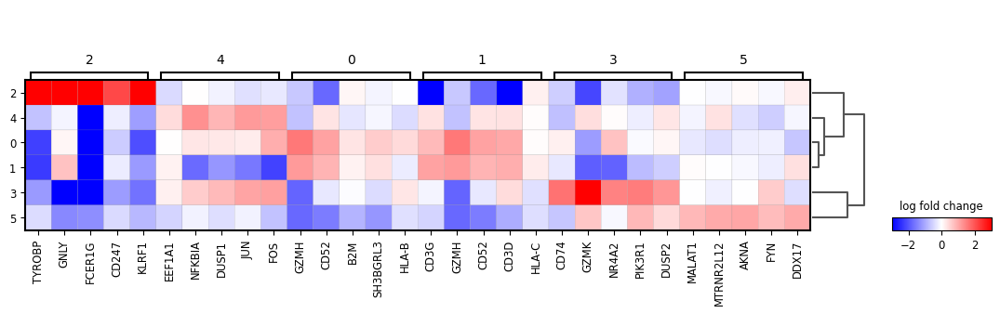

In [130]:
sc.pl.rank_genes_groups_matrixplot(adata_nk, n_genes=5, use_raw=False, values_to_plot="logfoldchanges", colorbar_title='log fold change', vmin=-3, vmax=3, cmap='bwr')

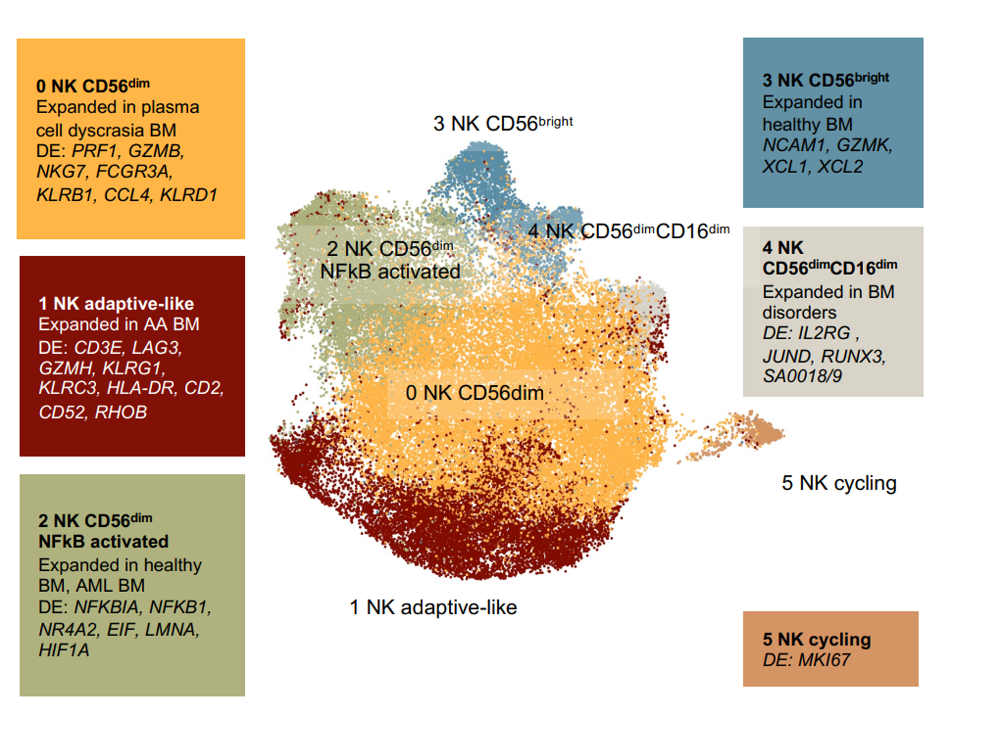


- following markers are collected from HRUH presentation about aplastic anemia (fig above)

In [128]:
cd56dim = ['PRF1', 'GZMB', 'NKG7', 'FCGR3A', 'KLRB1', 'CCL4', 'KLRD1']
adaptive_like = ['CD3E', 'LAG3', 'GZMH', 'KLRG1', 'KLRC3', 'CD2', 'CD52', 'RHOB'] #HLA-DR missing
activated = ['NFKBIA', 'NR4A2', 'LMNA', 'HIF1A'] #NKB1, EIF not found
cd56bright = ['GZMK', 'XCL1', 'XCL2'] #NCAM1 not found
cd56dimcd16dim= ['IL2RG', 'JUND', 'RUNX3'] #SA0018/9 not dounf
cycling = ['MK167']

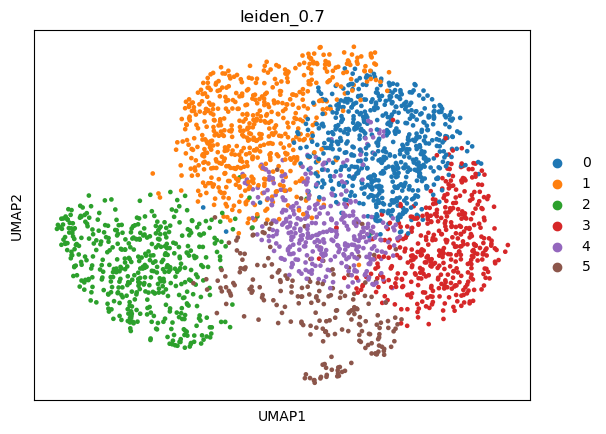

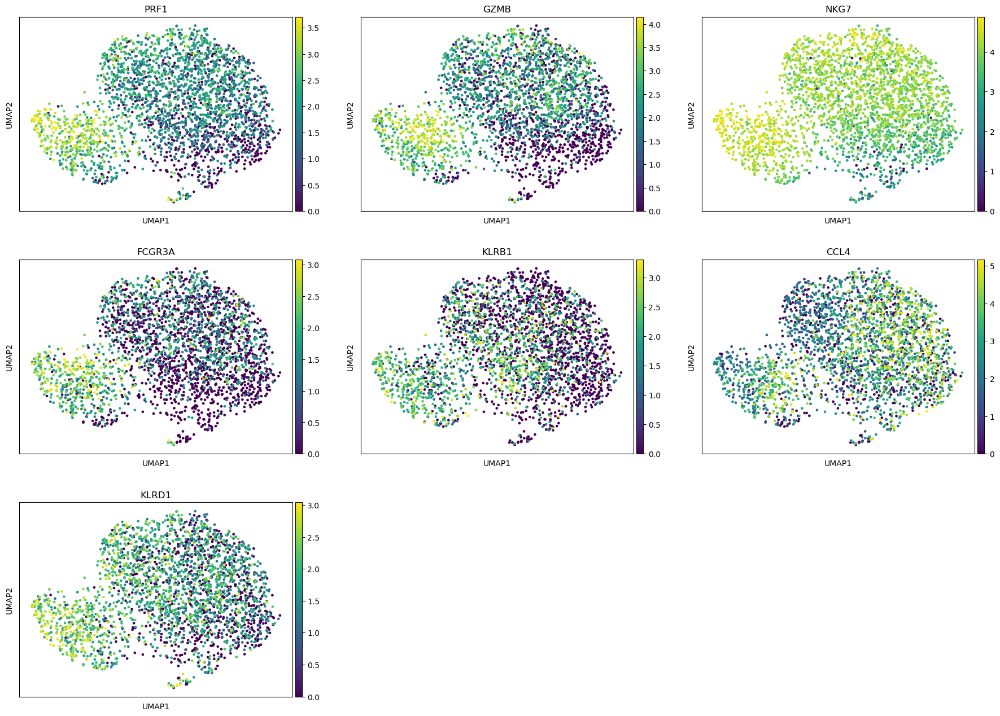

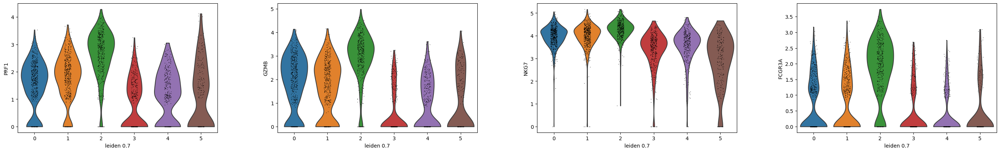

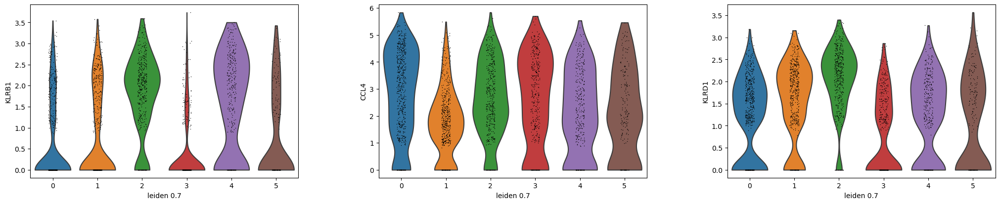

In [115]:
#CD56dim
sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=cd56dim, ncols = 3, vmax="p99")
sc.pl.violin(adata_nk, ['PRF1', 'GZMB', 'NKG7', 'FCGR3A'], groupby='leiden_0.7')
sc.pl.violin(adata_nk, ['KLRB1', 'CCL4', 'KLRD1'], groupby='leiden_0.7')



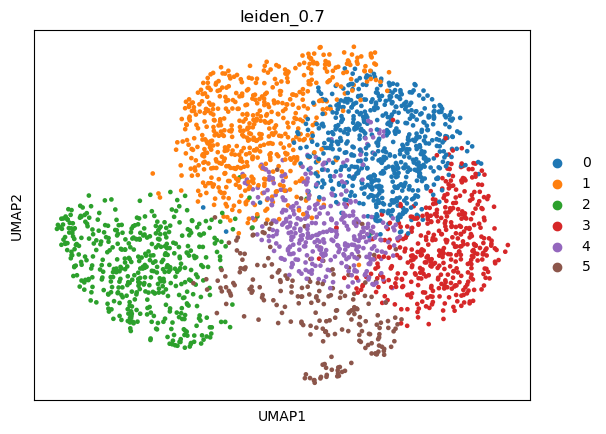

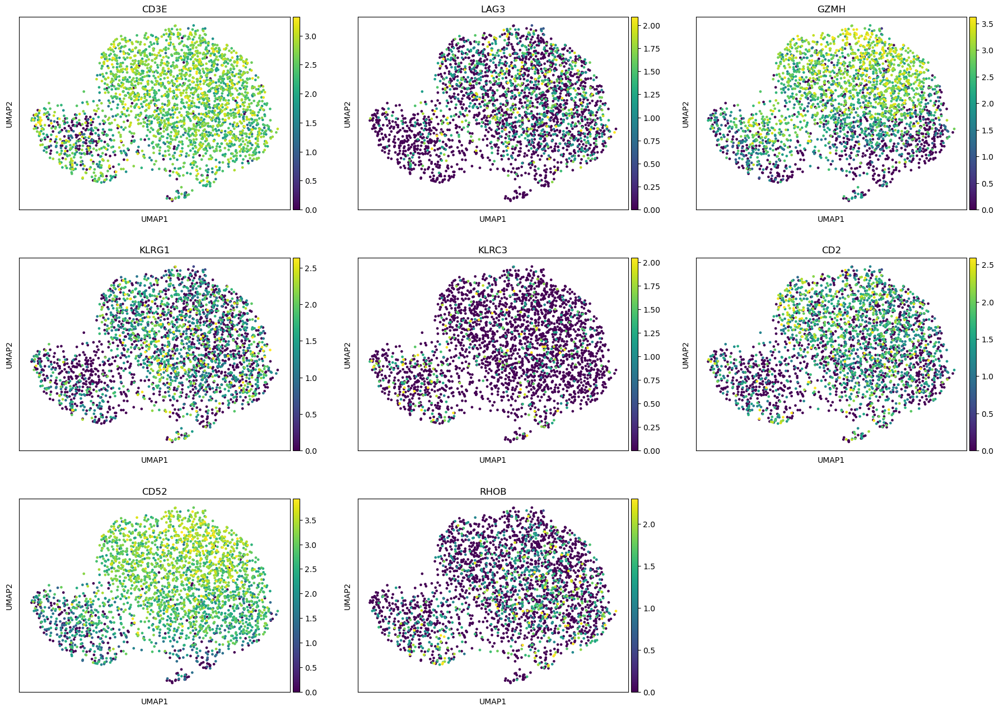

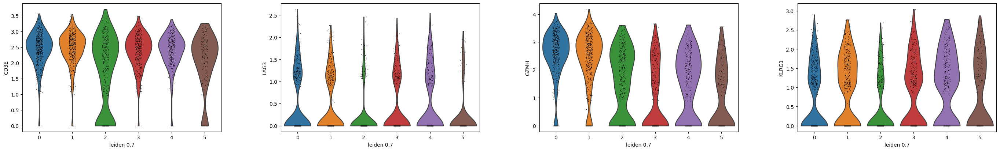

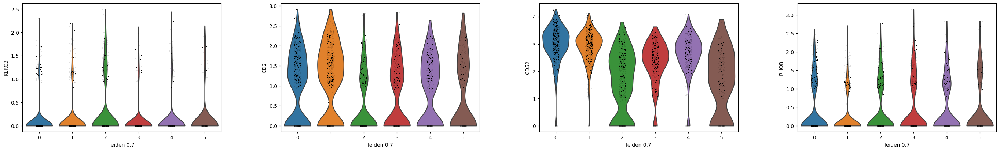

In [116]:
#Adaptive like NK cells

sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=adaptive_like, ncols = 3, vmax="p99")


sc.pl.violin(adata_nk, ['CD3E', 'LAG3', 'GZMH', 'KLRG1'], groupby='leiden_0.7')

sc.pl.violin(adata_nk, ['KLRC3', 'CD2', 'CD52', 'RHOB'], groupby='leiden_0.7')




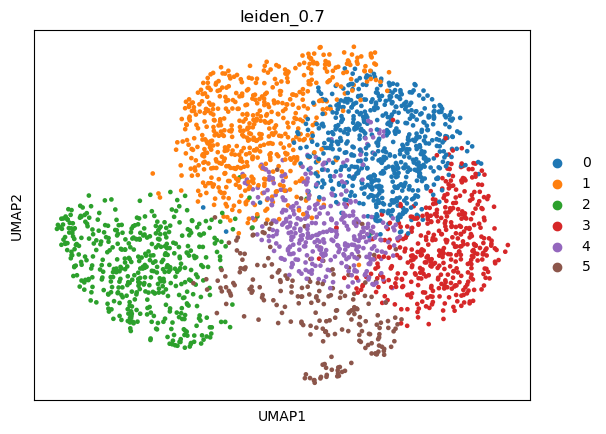

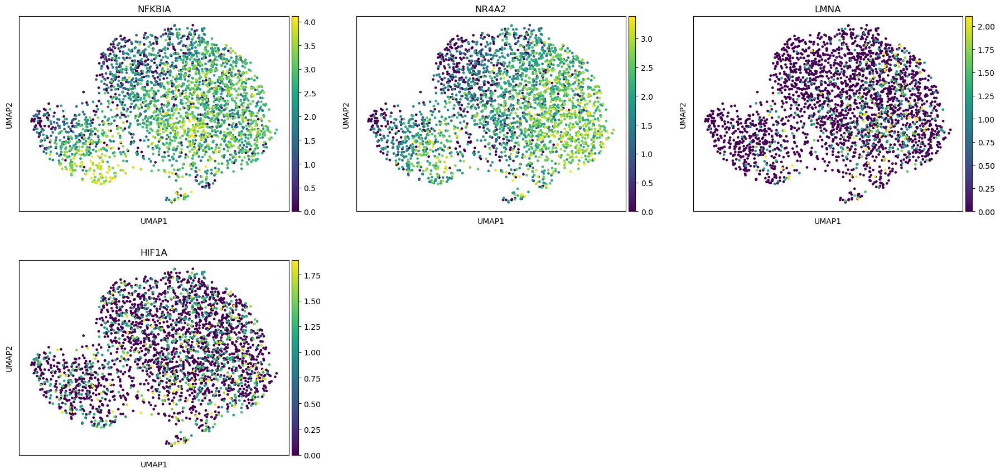

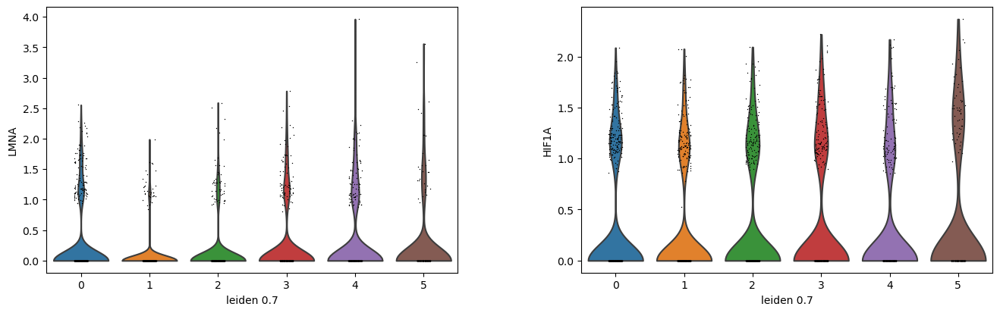

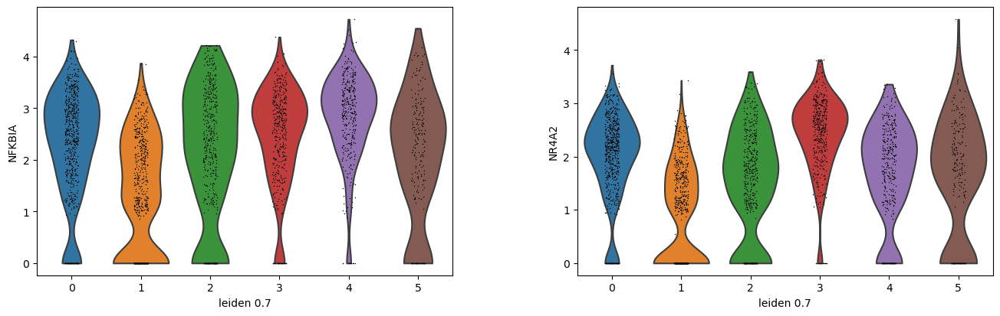

In [123]:
#Activated NK

sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=activated, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, ['LMNA', 'HIF1A'], groupby='leiden_0.7')
sc.pl.violin(adata_nk, ['NFKBIA' , 'NR4A2'], groupby='leiden_0.7') 




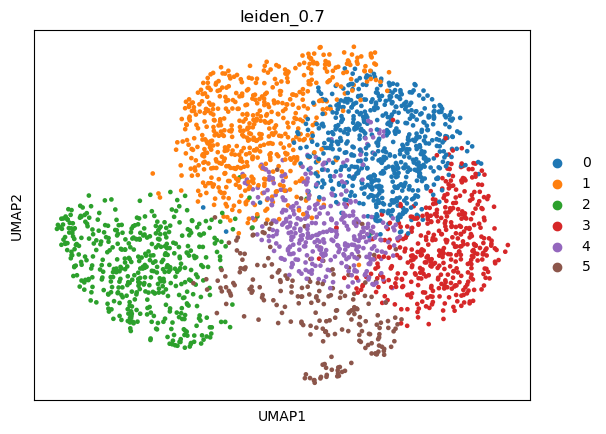

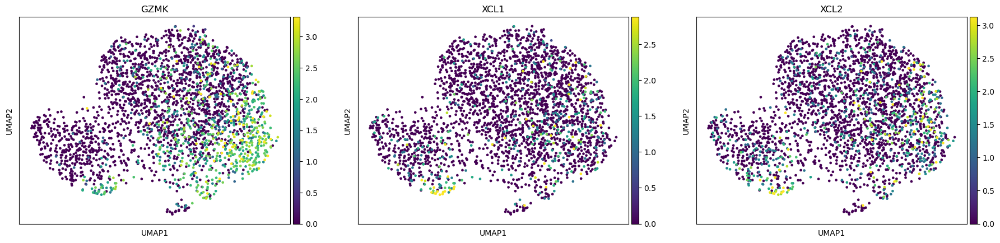

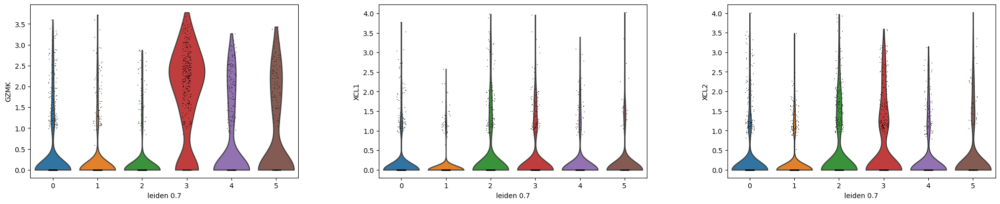

In [126]:
#CD56bright

sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=cd56bright, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk,  ['GZMK', 'XCL1', 'XCL2'], groupby='leiden_0.7')

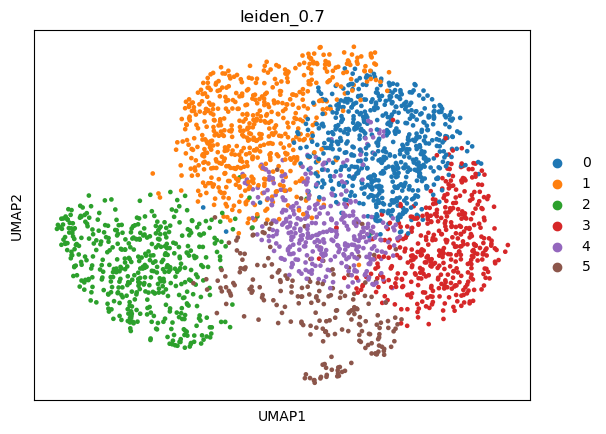

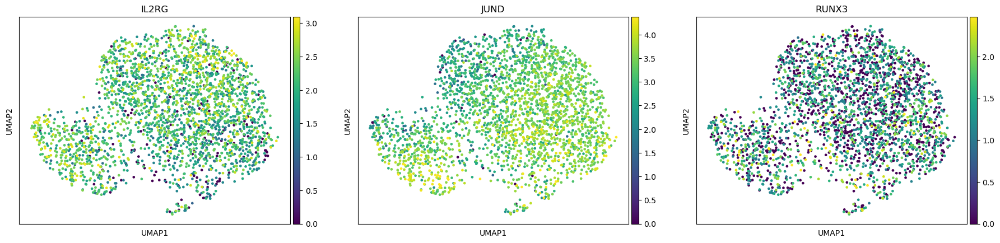

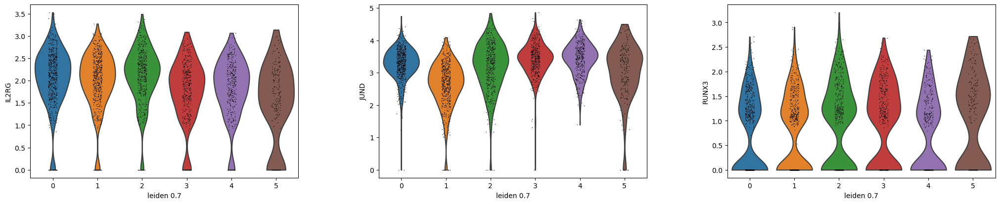

In [129]:
#CD56dim, CD16dim

sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=cd56dimcd16dim, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk,  ['IL2RG', 'JUND', 'RUNX3'], groupby='leiden_0.7')


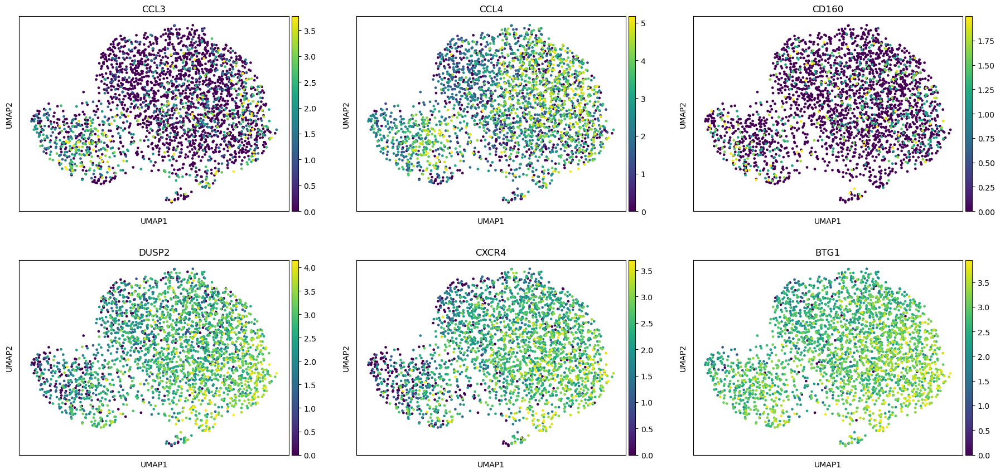

In [103]:
#Tissue-resident NK

tr_mels= ['CCL3', 'CCL4', 'CD160', 'DUSP2', 'CXCR4', 'BTG1'] #XCL1, GZMK not found

sc.pl.umap(adata_nk, color=tr_mels, ncols = 3, vmax="p99")

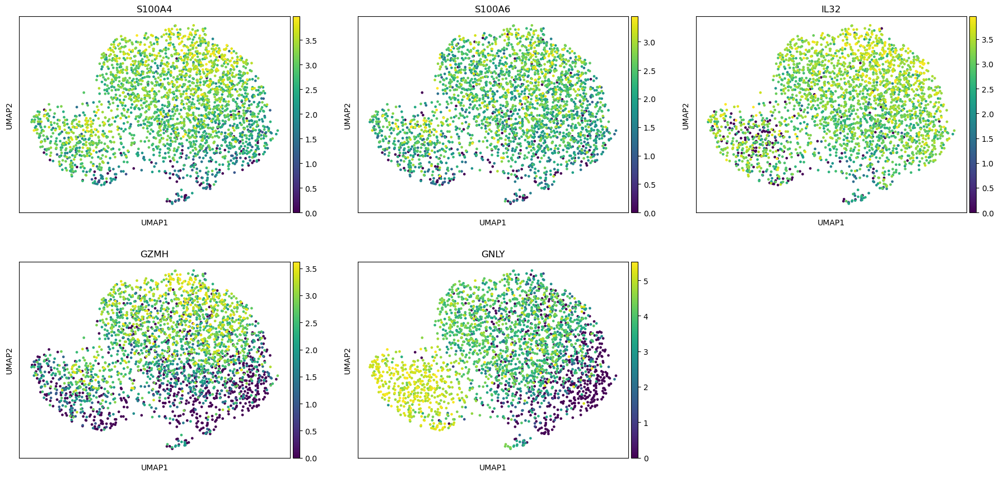

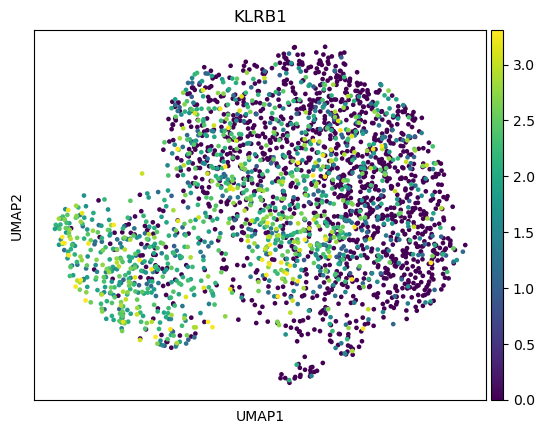

In [102]:
#proliferating NK

prolif_high = ['S100A4', 'S100A6', 'IL32', 'GZMH', 'GNLY'] #KLRC2 not found
prolif_low = ['KLRB1'] #KLRC1 not found

sc.pl.umap(adata_nk, color=prolif_high, ncols = 3, vmax="p99")
sc.pl.umap(adata_nk, color=prolif_low, ncols = 3, vmax="p99")

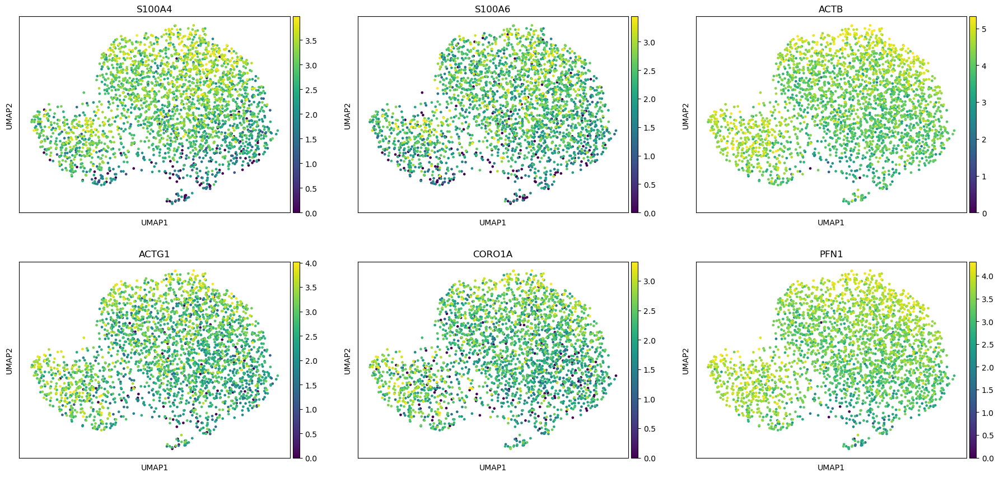

In [101]:
#Mature NK cells

cd56dim_1_high= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']
# cd56dim_1_low = ['GZMK'] not measured

sc.pl.umap(adata_nk, color=cd56dim_1_high, ncols = 3, vmax="p99")
#sc.pl.umap(adata_nk, color=cd56dim_1_low, ncols = 3, vmax="p99")



RNA markers


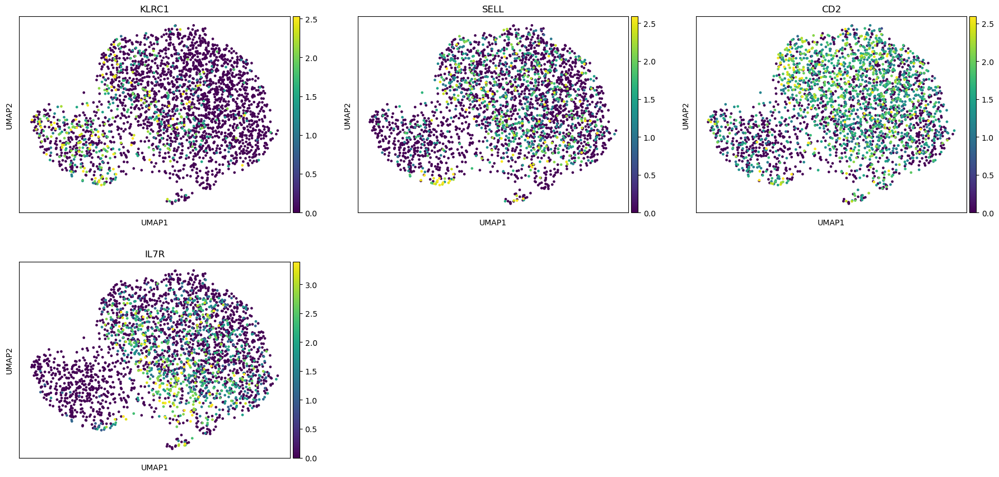

Protein markers


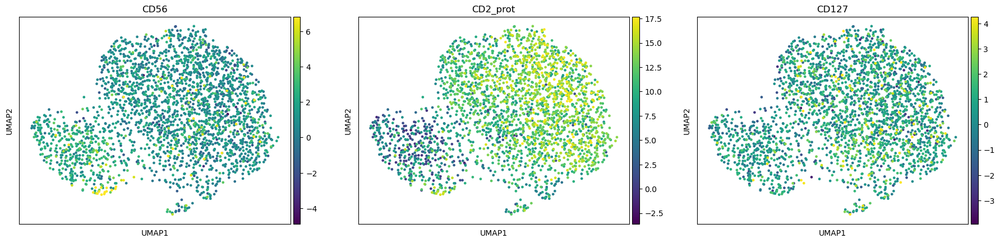

In [100]:
#CD56bright NK cells, SELL = CD62L, NCAM1 = CD56, IL7R = CD127

cd56bright_mels = ['KLRC1', 'SELL', 'CD2', 'IL7R'] #KIT, NCAM1 not found
cd56bright_mels_prot= ['CD56', "CD2_prot", 'CD127'] #CD62L not measured

print("RNA markers")
sc.pl.umap(adata_nk, color=cd56bright_mels, ncols = 3, vmax="p99")

print("Protein markers")

sc.pl.umap(adata_nk, color=cd56bright_mels_prot, ncols = 3, vmax="p99")

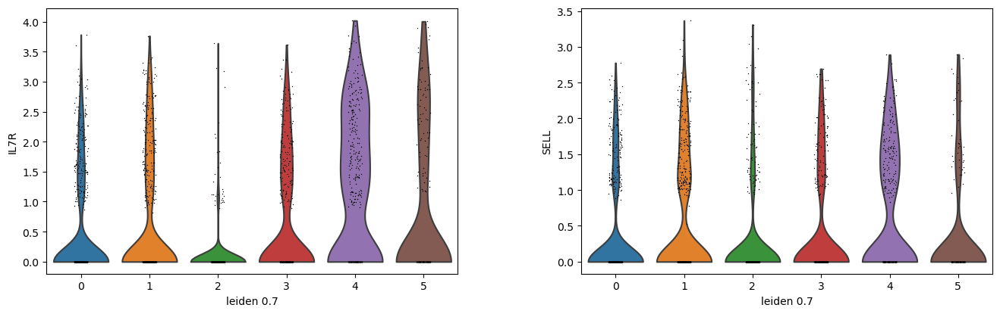

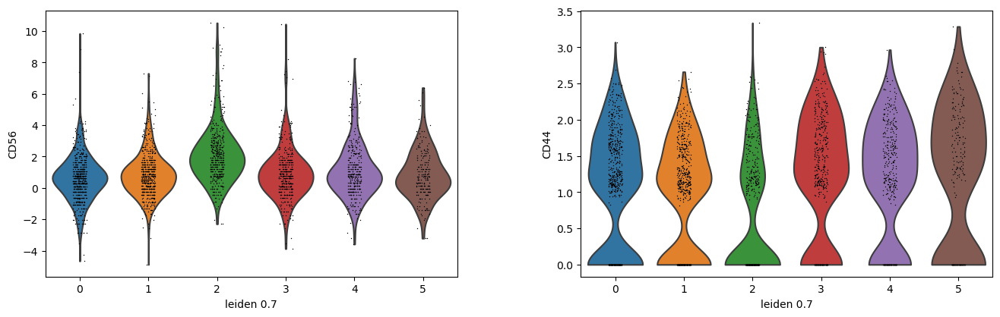

In [97]:
#CD56bright markers

sc.pl.violin(adata_nk, ['IL7R', 'SELL'], groupby='leiden_0.7')

sc.pl.violin(adata_nk, ['CD56', 'CD44'], groupby='leiden_0.7')